# Case Study: Zeeguu/API
- Backend of a web application that supports [free reading in foreign languages](https://zeeguu.org)
- Open source [repository on GH](https://github.com/zeeguu/API/)

# Everything that we did in Data Gathering & Abstraction


In [45]:
# Installing Required Dependencies
import sys
sys.version
!{sys.executable} -m pip install gitpython
!{sys.executable} -m pip install pyvis

^C


In [ ]:
# In Collab our notebook runs in a temporary mounted file system
# Let's print the name of the folder where our script runs

import os
cwd = os.getcwd()
print(cwd)


c:\Users\nikol\Documents\uni\CS2\Software Architecture\Individual project\Soft-Arch-Zeeguu-Api


In [ ]:
# Let's declare a var for the path where we're going to download a repository
# Warning: this must end in /
# CODE_ROOT_FOLDER="/content/zeeguu-api-2/"
CODE_ROOT_FOLDER="/Users/nikol/Documents/uni/CS2/Software Architecture/Individual project/api/"


In [ ]:
# from git import Repo
# GitPython is a library that allows us to work easily with git from Python
# https://gitpython.readthedocs.io/en/stable/tutorial.html


# If the file exists, it means we've already downloaded
# if not os.path.exists(CODE_ROOT_FOLDER):
#   Repo.clone_from("https://github.com/NiksenB/api", CODE_ROOT_FOLDER)



In [ ]:
# helper function to get a file path w/o having to always provide the /content/zeeguu-api/ prefix
def file_path(file_name):
    return CODE_ROOT_FOLDER+file_name

print (file_path("zeeguu/core/model/user.py"))

# assert (file_path("zeeguu/core/model/user.py") == "/content/zeeguu-api/zeeguu/core/model/user.py")
assert (file_path("zeeguu/core/model/user.py") == "/Users/nikol/Documents/uni/CS2/Software Architecture/Individual project/api/zeeguu/core/model/user.py")


/Users/nikol/Documents/uni/CS2/Software Architecture/Individual project/api/zeeguu/core/model/user.py


In [ ]:
# extracting a module name from a file name
def module_name_from_file_path(full_path):

    # e.g. ../core/model/user.py -> zeeguu.core.model.user

    file_name = full_path[len(CODE_ROOT_FOLDER):]
    file_name = file_name.replace("/__init__.py","")
    file_name = file_name.replace("/",".")
    file_name = file_name.replace(".py","")
    return file_name

assert 'zeeguu.core.model.user' == module_name_from_file_path(file_path('zeeguu/core/model/user.py'))

In [ ]:
# naïve way of extracting imports using regular expressions
import re


# we assume that imports are always at the
# TODO for you: add full support for imports; this is not complete...
def import_from_line(line):

    # regex patterns used
    #   ^  - beginning of line
    #   \S - anything that is not space
    #   +  - at least one occurrence of previous
    #  ( ) - capture group (read more at: https://pynative.com/python-regex-capturing-groups/)
    try:
      y = re.search(r"^from (\S+)", line)
      if not y:
        y = re.search(r"^import (\S+)", line)
      return y.group(1)
    except:
      return None


# extracts all the imported modules from a file
# returns a module of the form zeeguu_core.model.bookmark, e.g.
def imports_from_file(file):

    all_imports = []

    lines = [line for line in open(file)]

    for line in lines:
        imp = import_from_line(line)

        if imp:
            all_imports.append(imp)

    return all_imports

imports_from_file(file_path('zeeguu/core/model/user.py'))

['datetime',
 'json',
 'random',
 're',
 'sqlalchemy.orm',
 'zeeguu.core',
 'sqlalchemy',
 'sqlalchemy.orm',
 'sqlalchemy.orm.exc',
 'zeeguu.core.language.difficulty_estimator_factory',
 'zeeguu.core.model.language',
 'zeeguu.core.model.learning_cycle',
 'zeeguu.logging',
 'zeeguu.core.util',
 'zeeguu.core.model',
 'zeeguu.logging']

In [ ]:
# test
print(imports_from_file(file_path('zeeguu/core/model/bookmark.py')))
print(imports_from_file(file_path('zeeguu/core/model/unique_code.py')))

['datetime', 'sqlalchemy', 'sqlalchemy', 'sqlalchemy.orm', 'sqlalchemy.orm.exc', 'zeeguu.core.model.caption', 'zeeguu.core.model.video', 'zeeguu.logging', 'zeeguu.core.bookmark_quality.fit_for_study', 'zeeguu.core.model.article', 'zeeguu.core.model.exercise', 'zeeguu.core.model.exercise_outcome', 'zeeguu.core.model.exercise_source', 'zeeguu.core.model.language', 'zeeguu.core.model.source', 'zeeguu.core.model.text', 'zeeguu.core.model.user', 'zeeguu.core.model.user_word', 'zeeguu.core.model.learning_cycle', 'zeeguu.core.model.bookmark_user_preference', 'zeeguu.core.model.bookmark_context', 'zeeguu.core.model', 'zeeguu.core.util.encoding', 'wordstats']
['datetime', 'random', 'sqlalchemy', 'zeeguu.core.model']


## Now we extract the dependencies between all the files

To do that we iterate over all the python files with the hel pf the `Path.rglob` function from `pathlib`

And we create a network with the help of the `networkx` package.

In [ ]:
import pathlib
from pathlib import Path
import networkx as nx

def dependencies_graph(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.Graph()

    for file in files:
        file_path = str(file)

        module_name = module_name_from_file_path(file_path)

        if module_name not in G.nodes:
            G.add_node(module_name)

        for each in imports_from_file(file_path):

            # i want the edge weight to correspond to the number of times a module is imported
            # if the module is already in the graph, we increase the weight of the edge
            if G.has_edge(module_name, each):
                G[module_name][each]['weight'] += 1
            else:
                G.add_edge(module_name, each, weight=1)

            # G.add_edge(module_name, each)

    return G

## Mathplotlib also has support for drawing networks

We do a simple drawing of all the files and their dependencies in our system

In [ ]:
import matplotlib.pyplot as plt

# a function to draw a graph
def draw_graph(G, size, **args):
    plt.figure(figsize=size)
    nx.draw(G, **args)
    plt.show()

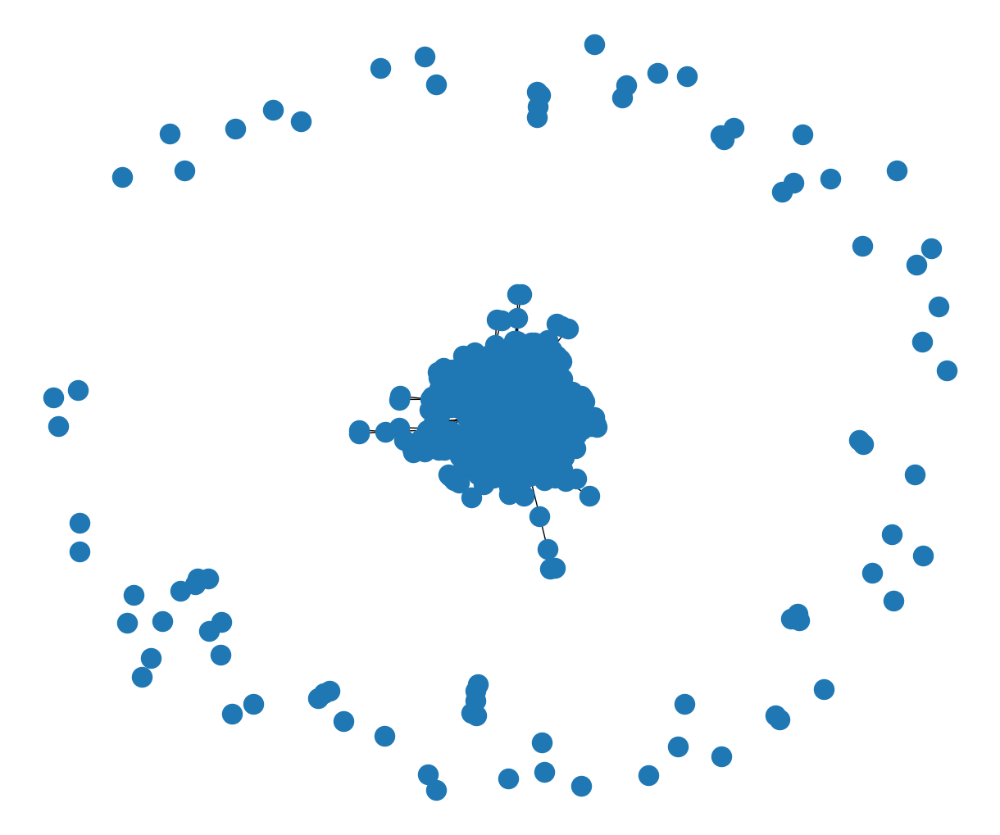

In [ ]:
G = dependencies_graph(CODE_ROOT_FOLDER)
draw_graph(G, (12,10), with_labels=False)

## Abstraction

In [ ]:
# Let's define some relevant modules
def relevant_module(module_name):

  if "test" in module_name:
    return False


  if module_name.startswith("zeeguu"):
    return True


  return False

In [ ]:
# However, if we think a bit more about it, we realize that a dependency graph
# is a directed graph (e.g. module A depends on m)
# with any kinds of graph either directed (nx.DiGraph) or
# non-directed (nx.Graph)

def dependencies_digraph(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

            if relevant_module(target_module):

              if G.has_edge(source_module, target_module):
                G[source_module][target_module]['weight'] += 1
              else:
                  G.add_edge(source_module, target_module, weight=1)

              # G.add_edge(source_module, target_module)


    return G


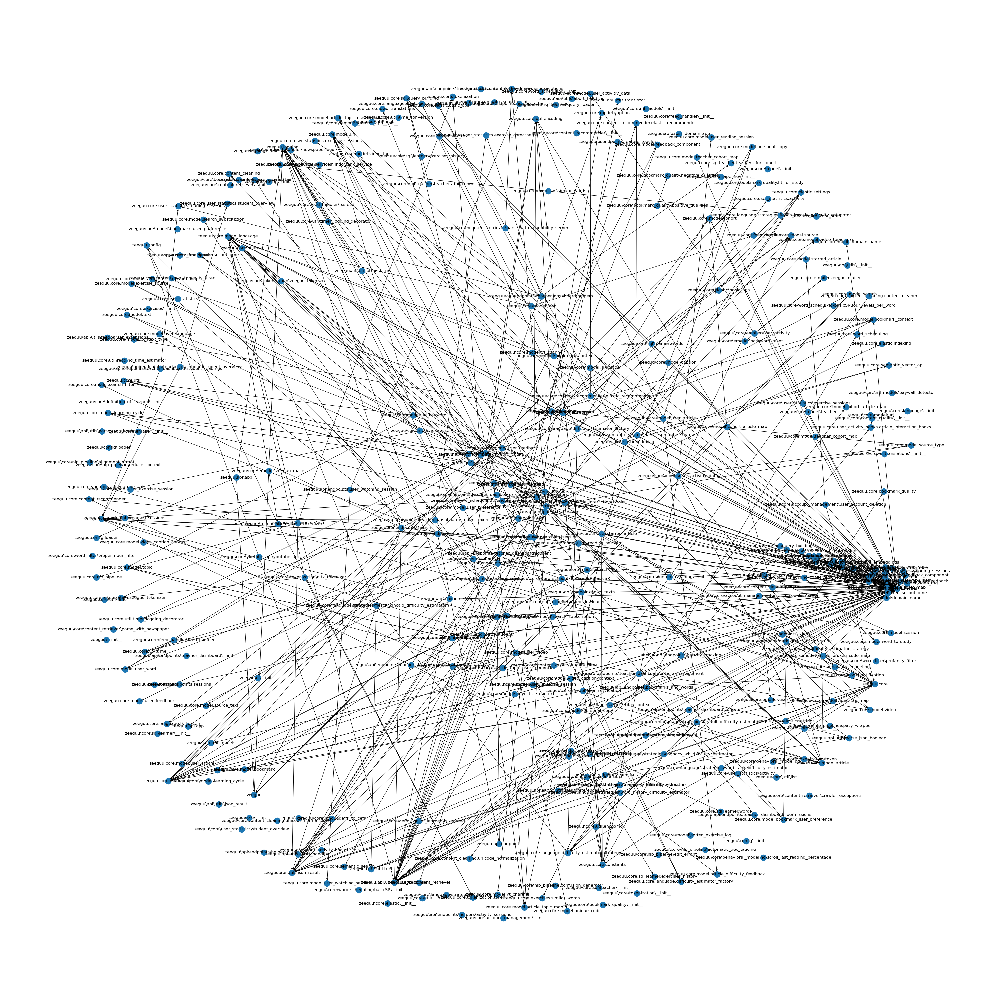

In [ ]:
# Looking at the directed graph
DG = dependencies_digraph(CODE_ROOT_FOLDER)
draw_graph(DG, (40,40), with_labels=True)

## Basic Abstraction Using Hierarchical Module Structure & Naming Conventions

- abstracting the imports between the modules along the module hierarchy
- also taking into account naming conventions to filter out external modules

In [ ]:
# extracts the parent of depth X
def top_level_package(module_name, depth=1):
    module_name = module_name.replace("/", ".").replace("\\", ".")
    components = module_name.split(".")
    return ".".join(components[:depth])

assert (top_level_package("zeeguu.core.model.util") == "zeeguu")
assert (top_level_package("zeeguu.core.model.util", 2) == "zeeguu.core")

In [ ]:
def abstracted_to_top_level(G, depth=1):
    aG = nx.DiGraph()
    for each in G.edges():
        src = top_level_package(each[0], depth)
        dst = top_level_package(each[1], depth)

        if src != dst:
          aG.add_edge(src, dst)

    return aG

In [ ]:
ADG = abstracted_to_top_level(DG, 2)  

In [ ]:
plt.figure(figsize=(10,10))

# draw the graph with edge weights
edge_labels = nx.get_edge_attributes(ADG, 'weight')

# draw with edge labels
pos = nx.spring_layout(ADG, k=0.5, iterations=20)
plt.show()

<Figure size 1000x1000 with 0 Axes>

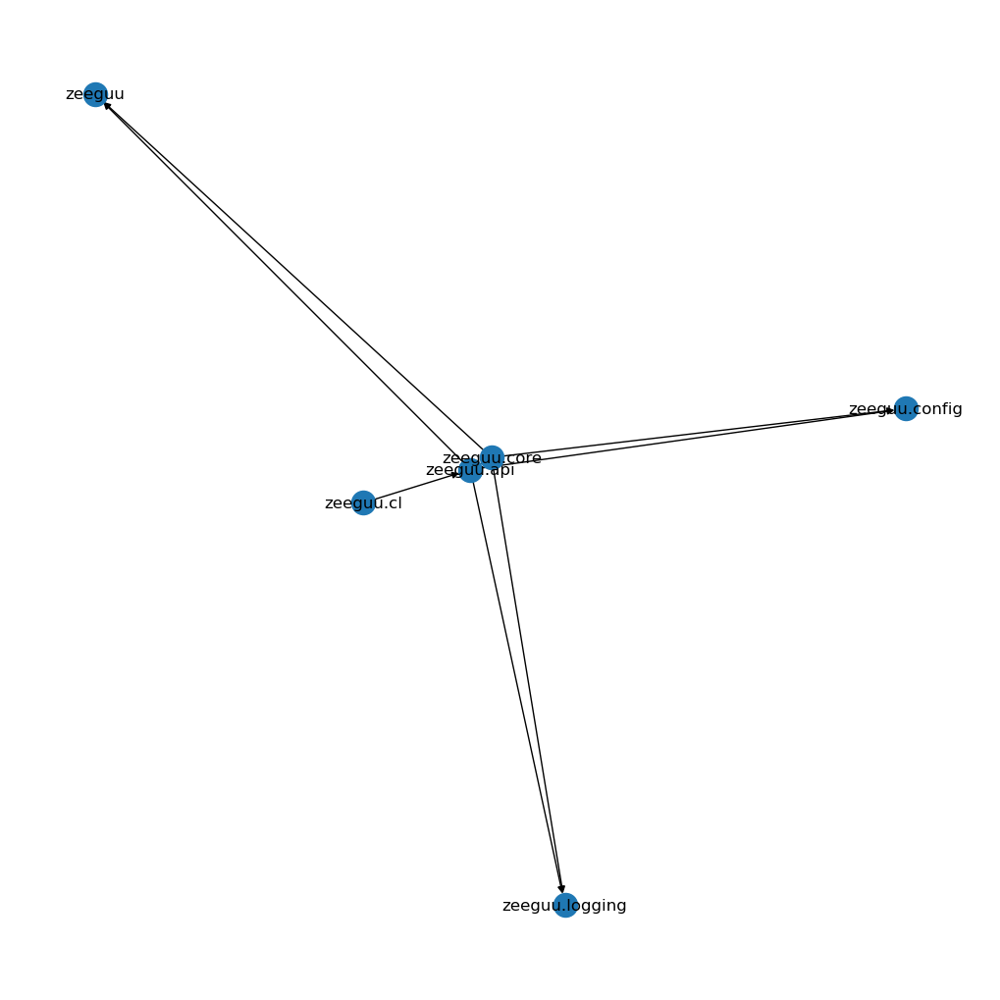

In [ ]:
# NIKO tries
DG_zeeguu = dependencies_digraph(CODE_ROOT_FOLDER + '/zeeguu')
ADG_zeeguu = abstracted_to_top_level(DG_zeeguu, 2)

plt.figure(figsize=(10,10))
nx.draw(ADG_zeeguu, with_labels=True)
plt.show()


# Evolution Analysis

In [ ]:
!{sys.executable} -m pip install pydriller==2.6


In [ ]:
from pydriller import Repository
REPO_DIR = 'https://github.com/NiksenB/api'

In [ ]:
# for PyDriller to work we need to change directory to our local clone of the repo
%cd /Users/nikol/Documents/uni/CS2/Software Architecture/Individual project/api/

c:\Users\nikol\Documents\uni\CS2\Software Architecture\Individual project\api


In [ ]:
all_commits = list(Repository(REPO_DIR).traverse_commits())

def print_out_commit_details(commits):
  for commit in commits:
      print(commit)
      for each in commit.modified_files:
          print(f"{commit.author.name} {each.change_type} {each.filename}\n -{each.old_path}\n -{each.new_path}")

print_out_commit_details(all_commits[0:1])

Mircea Lungu ModificationType.ADD LICENSE
 -None
 -LICENSE
Mircea Lungu ModificationType.ADD README.md
 -None
 -README.md
Mircea Lungu ModificationType.ADD s
 -None
 -s
Mircea Lungu ModificationType.ADD setup.py
 -None
 -setup.py
Mircea Lungu ModificationType.ADD zeeguu_api.wsgi
 -None
 -zeeguu_api.wsgi
Mircea Lungu ModificationType.ADD __init__.py
 -None
 -zeeguu_api\__init__.py
Mircea Lungu ModificationType.ADD __main__.py
 -None
 -zeeguu_api\__main__.py
Mircea Lungu ModificationType.ADD __init__.py
 -None
 -zeeguu_api\api\__init__.py
Mircea Lungu ModificationType.ADD download_content_from_url.py
 -None
 -zeeguu_api\api\download_content_from_url.py
Mircea Lungu ModificationType.ADD exercises.py
 -None
 -zeeguu_api\api\exercises.py
Mircea Lungu ModificationType.ADD feeds.py
 -None
 -zeeguu_api\api\feeds.py
Mircea Lungu ModificationType.ADD sessions.py
 -None
 -zeeguu_api\api\sessions.py
Mircea Lungu ModificationType.ADD smartwatch.py
 -None
 -zeeguu_api\api\smartwatch.py
Mircea Lungu 

In [ ]:
from collections import defaultdict

commit_counts = defaultdict(int)

for commit in all_commits:
    try:
        for each in commit.modified_files:
            try:
                commit_counts [each.new_path] += 1
            except:
                pass
    except:
        pass


# sort by number of commits in decreasing order
sorted(commit_counts.items(), key=lambda x: x[1], reverse=True)[:42]

# discussion: What is ("None", 103) ?

[(None, 211),
 ('zeeguu\\core\\model\\article.py', 84),
 ('zeeguu_api\\api\\dashboard.py', 80),
 ('zeeguu_api\\api\\translate_and_bookmark.py', 78),
 ('zeeguu_api\\api\\teacher_dashboard.py', 76),
 ('zeeguu\\core\\content_retriever\\article_downloader.py', 75),
 ('requirements.txt', 69),
 ('zeeguu\\core\\model\\bookmark.py', 68),
 ('zeeguu\\core\\content_recommender\\elastic_recommender.py', 55),
 ('zeeguu\\core\\elastic\\elastic_query_builder.py', 55),
 ('README.md', 52),
 ('zeeguu\\core\\emailer\\zeeguu_mailer.py', 52),
 ('zeeguu_api\\api\\feeds.py', 51),
 ('zeeguu_api\\app.py', 51),
 ('zeeguu\\core\\model\\user.py', 50),
 ('zeeguu\\core\\model\\__init__.py', 47),
 ('zeeguu\\core\\model\\video.py', 47),
 ('setup.py', 46),
 ('zeeguu_api\\api\\__init__.py', 44),
 ('zeeguu\\core\\elastic\\indexing.py', 43),
 ('zeeguu\\api\\endpoints\\translation.py', 41),
 ('zeeguu\\core\\word_scheduling\\basicSR\\basicSR.py', 39),
 ('Dockerfile', 37),
 ('zeeguu\\core\\model\\user_activitiy_data.py', 35

In [ ]:
from pydriller import ModificationType

commit_counts = {}

for commit in all_commits:
    try: 
        for modification in commit.modified_files:

            new_path = modification.new_path
            old_path = modification.old_path

            try:

                if modification.change_type == ModificationType.RENAME:
                    commit_counts[new_path]=commit_counts.get(old_path,0)+1
                    commit_counts.pop(old_path)

                elif modification.change_type == ModificationType.DELETE:
                    commit_counts.pop(old_path, '')

                elif modification.change_type == ModificationType.ADD:
                    commit_counts[new_path] = 1

                else: # modification to existing file
                        commit_counts [old_path] += 1
            except Exception as e:
                print(str(e) + "something went wrong with: " + str(modification))
                pass
    except:
        pass

sorted(commit_counts.items(), key=lambda x:x[1], reverse=True)

'tools\\run_knn_topic_inferance.py'something went wrong with: <pydriller.domain.commit.ModifiedFile object at 0x0000027B8DE45100>
'tools\\run_knn_topic_inferance.py'something went wrong with: <pydriller.domain.commit.ModifiedFile object at 0x0000027B8DF46540>
'tools\\run_knn_topic_inferance.py'something went wrong with: <pydriller.domain.commit.ModifiedFile object at 0x0000027B8E71C9B0>
'tools\\migrations\\25-02-28--02-delete-unused-columns-article.sql'something went wrong with: <pydriller.domain.commit.ModifiedFile object at 0x0000027B8E327CB0>


[('zeeguu\\api\\endpoints\\translation.py', 130),
 ('zeeguu\\core\\model\\article.py', 94),
 ('zeeguu\\api\\app.py', 81),
 ('zeeguu\\core\\model\\bookmark.py', 80),
 ('zeeguu\\core\\content_retriever\\article_downloader.py', 77),
 ('requirements.txt', 65),
 ('zeeguu\\core\\elastic\\elastic_query_builder.py', 58),
 ('zeeguu\\api\\endpoints\\__init__.py', 58),
 ('zeeguu\\core\\content_recommender\\elastic_recommender.py', 57),
 ('zeeguu\\api\\endpoints\\exercises.py', 57),
 ('zeeguu\\api\\endpoints\\feature_toggles.py', 56),
 ('zeeguu\\core\\model\\user.py', 55),
 ('zeeguu\\core\\emailer\\zeeguu_mailer.py', 53),
 ('README.md', 52),
 ('zeeguu\\core\\model\\__init__.py', 50),
 ('zeeguu\\api\\endpoints\\user.py', 47),
 ('zeeguu\\core\\model\\video.py', 47),
 ('setup.py', 46),
 ('zeeguu\\api\\endpoints\\search.py', 45),
 ('zeeguu\\core\\elastic\\indexing.py', 43),
 ('zeeguu\\api\\endpoints\\bookmarks_and_words.py', 43),
 ('zeeguu\\api\\endpoints\\user_articles.py', 43),
 ('zeeguu\\core\\word

In [ ]:


def module_name_from_rel_path(full_path):

    # e.g. ../core/model/user.py -> zeeguu.core.model.user

    file_name = full_path.replace("/__init__.py","")
    file_name = file_name.replace("/",".")
    file_name = file_name.replace(".py","")
    return file_name


assert ("tools.migrations.teacher_dashboard_migration_1.upgrade" == module_name_from_rel_path("tools/migrations/teacher_dashboard_migration_1/upgrade.py"))

assert ("zeeguu.api") == module_name_from_rel_path("zeeguu/api/__init__.py")

In [ ]:
package_activity = defaultdict(int)

for path, count in commit_counts.items():
    if ".py" in str(path):
        l2_module = top_level_package(module_name_from_rel_path(path), 2)
        package_activity[l2_module] += count

sorted_sizes = sorted(package_activity.items(), key=lambda x: x[1], reverse=True)

print(sorted_sizes)



[('zeeguu.core', 2137), ('zeeguu.api', 1226), ('tools.old', 179), ('setup', 46), ('tools.update_article_content', 33), ('tools.report_generator', 33), ('tools.feed_retrieval', 21), ('tools._playground', 16), ('zeeguu.config', 16), ('tools.evaluate_infer_topics', 16), ('tools.activity_monitor', 14), ('tools.send_subscription_emails', 12), ('tools.run_knn_similarity_search', 12), ('tools.update_bookmark_pointers', 12), ('tools.transform_text_into_context', 12), ('tools.mysql_to_elastic_for_articles', 12), ('start', 11), ('tools.delete_dev_users', 11), ('tools.update_es_based_on_url_keyword', 11), ('tools.article_crawler', 10), ('tools.anonymize_users', 9), ('tools.add_feed', 7), ('tools.extract_articles_with_new_topics', 7), ('tools.tokenizer_playground', 7), ('tools.remove_wrong_videos', 7), ('env_var_defs_default', 6), ('tools.feed_info', 6), ('tools.set_new_topics_article', 6), ('tools.mark_broken_articles', 5), ('tools.crawl_summary', 5), ('tools.users_recently_active', 5), ('tools.f

In [ ]:
# Replace repository with your own
REPO_DIR = r"C:\Users\nikol\Documents\uni\CS2\Software Architecture\Individual project\api"

In [ ]:

sizes = []

for n in ADG.nodes():
  sizes.append(package_activity[n])

print(sizes)




[1226, 16, 0, 2, 2, 2137]


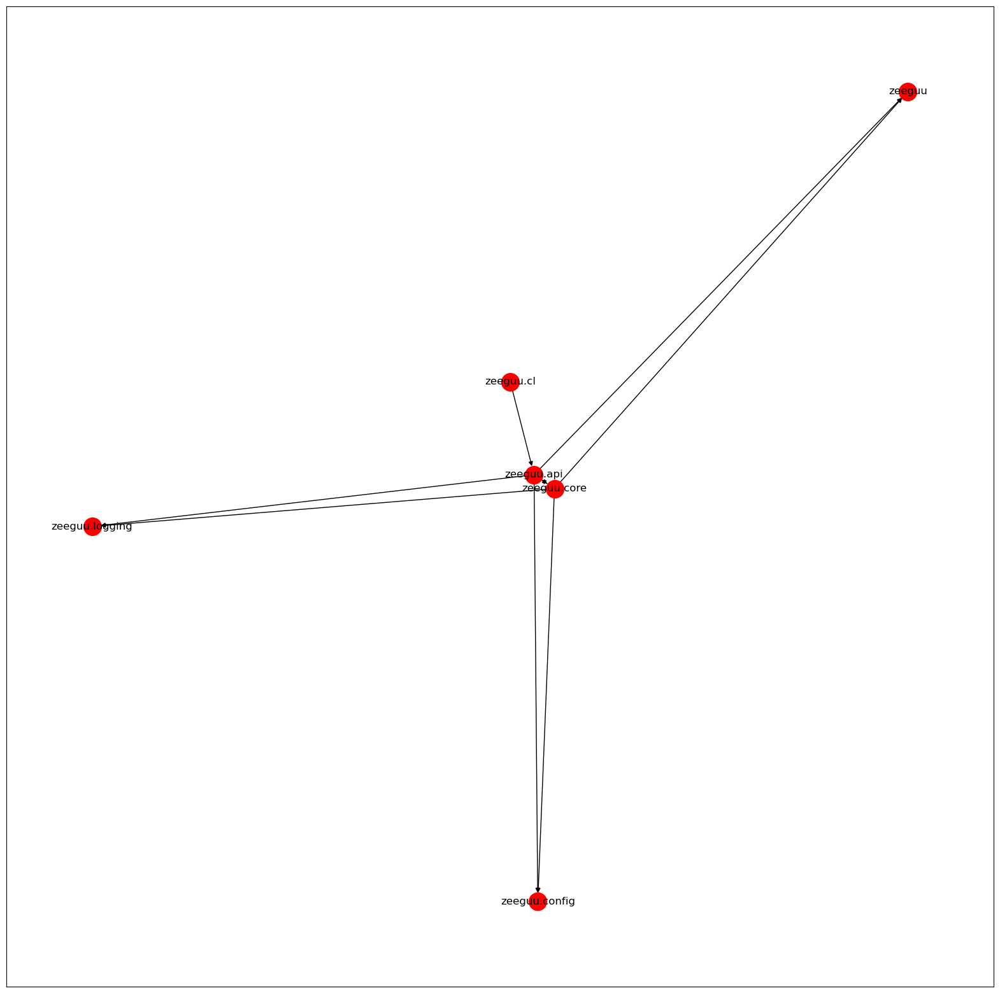

In [ ]:



plt.figure(figsize=(20,20))
nx.draw_networkx(ADG, with_labels=True, node_size = 400, node_color='r')
plt.show()

# For Home: Extract Multiple Evolution Hotspots from Zeeguu

- Extract multiple complementary module views from your case study system
- Ensure that your layouts are readable - limit the number of nodes in a view, use a different layout in networkx, or use a different library than networkx
- Augment each of the previously obtained module views by mapping the above-computed churn metric on the color of a given node

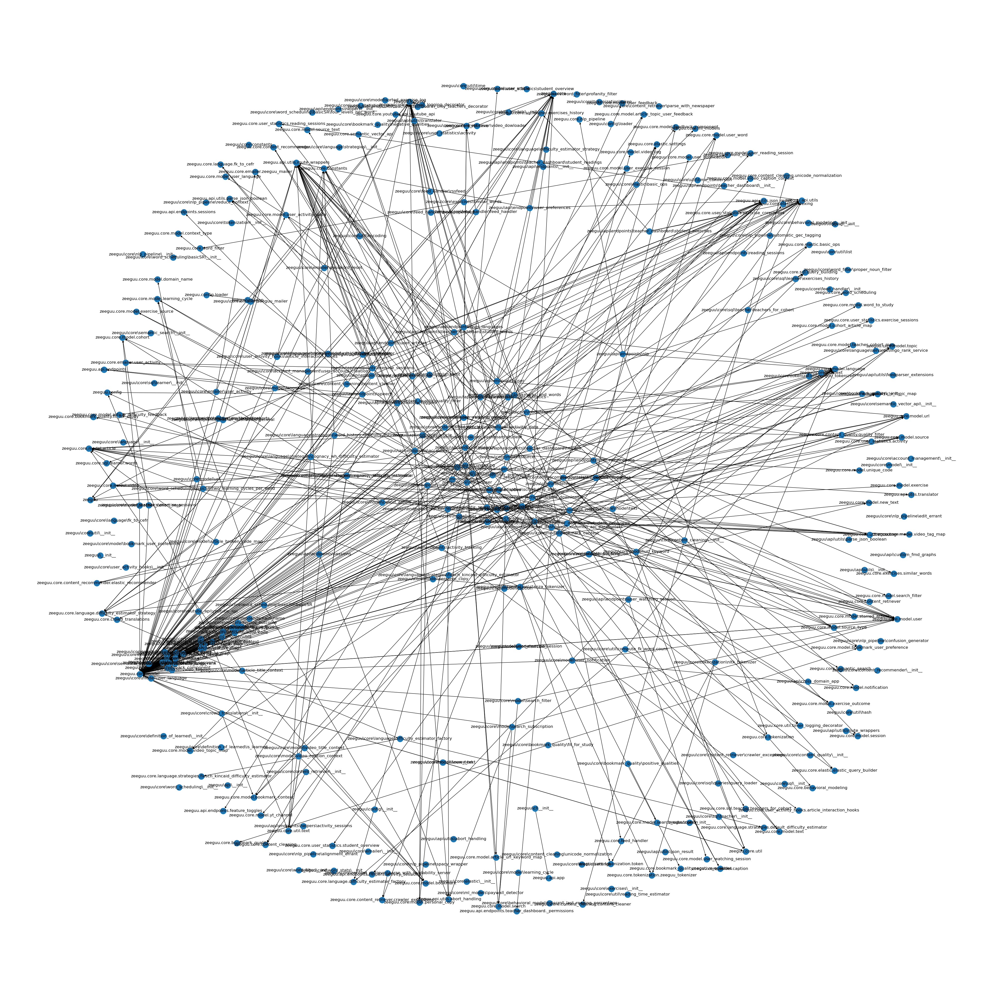

In [ ]:
# i will now extract multiple complementary module views from zeeguu-api system by first showing directed graphs that omit redundant edges

def dependencies_digraph_modified(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

            if relevant_module(target_module):
              G.add_edge(source_module, target_module)


    return G 

DDM = dependencies_digraph_modified(CODE_ROOT_FOLDER)
draw_graph(DDM, (40,40), with_labels=True)

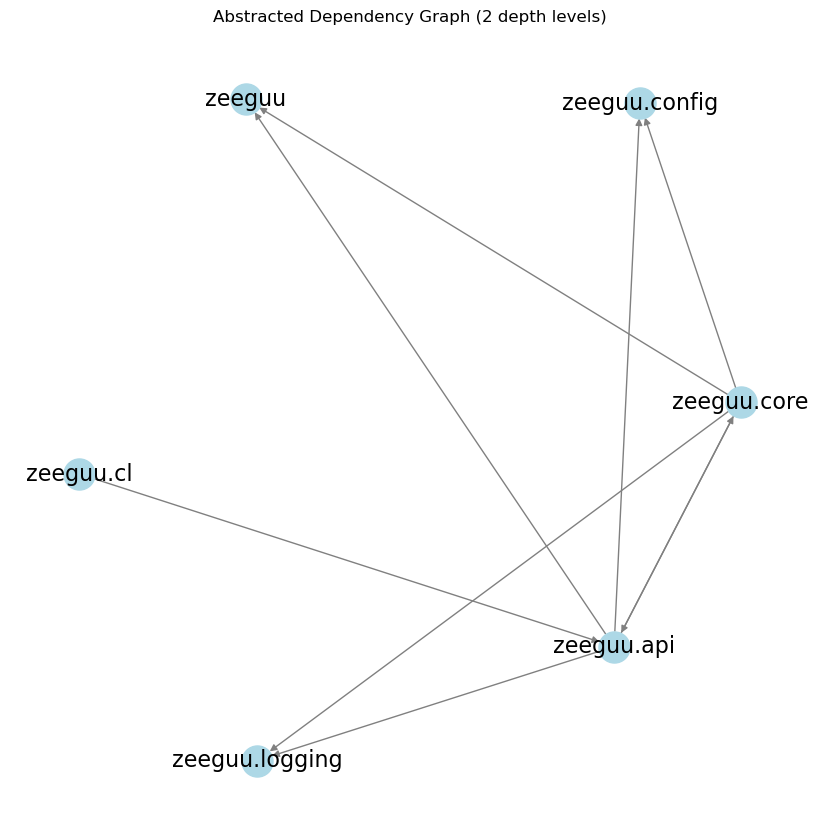

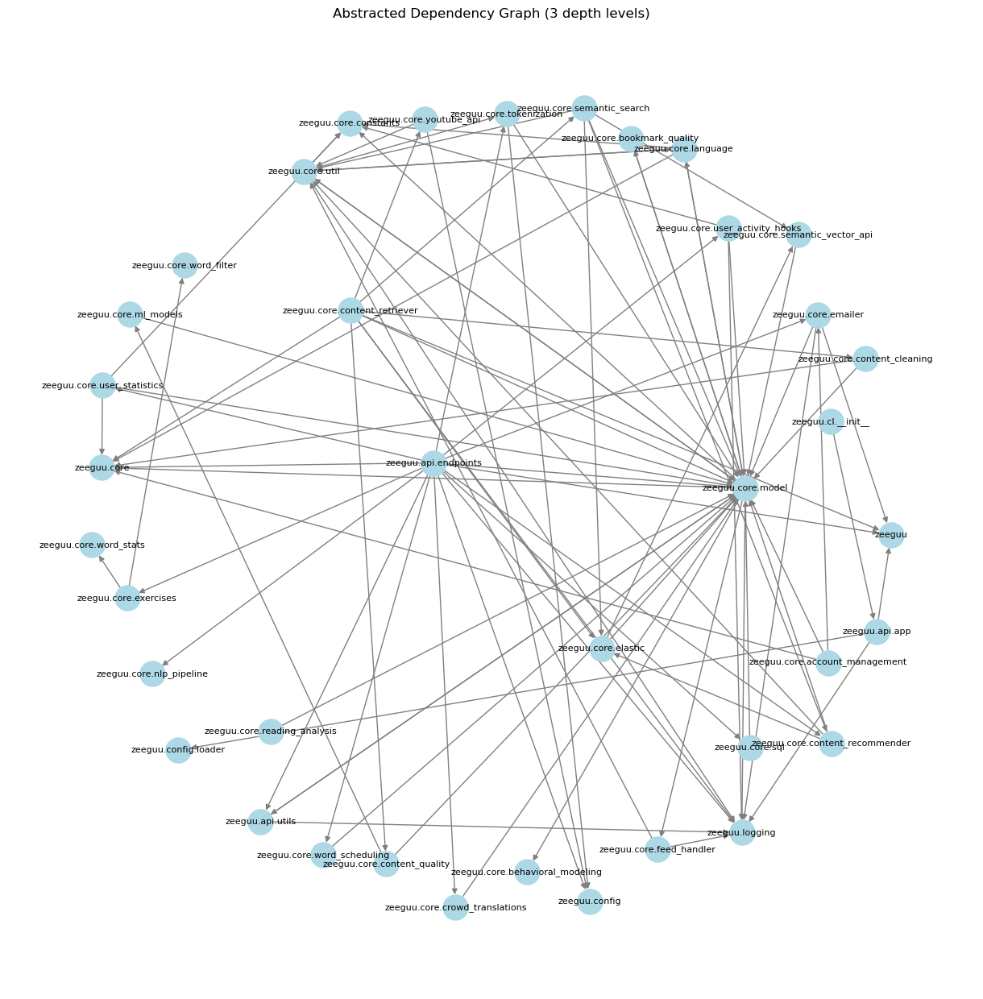

In [ ]:
ADG2 = abstracted_to_top_level(DG, depth=2)  
ADG3 = abstracted_to_top_level(DG, depth=3) 

ADG2 = abstracted_to_top_level(DG, depth=2)  
ADG3 = abstracted_to_top_level(DG, depth=3) 

plt.figure(figsize=(8, 8))
nx.draw(ADG2, pos=nx.spring_layout(ADG2, k=3), with_labels=True, node_size=500, node_color='lightblue', edge_color='gray', font_size=16)
plt.title("Abstracted Dependency Graph (2 depth levels)")
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\ADG2.png", dpi=300, bbox_inches='tight')
plt.show()

plt.figure(figsize=(12, 12))
nx.draw(ADG3, pos=nx.spring_layout(ADG3, k=2.2), with_labels=True, node_size=500, node_color='lightblue', edge_color='gray', font_size=8)
plt.title("Abstracted Dependency Graph (3 depth levels)")
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\ADG3.png", dpi=300, bbox_inches='tight')
plt.show()


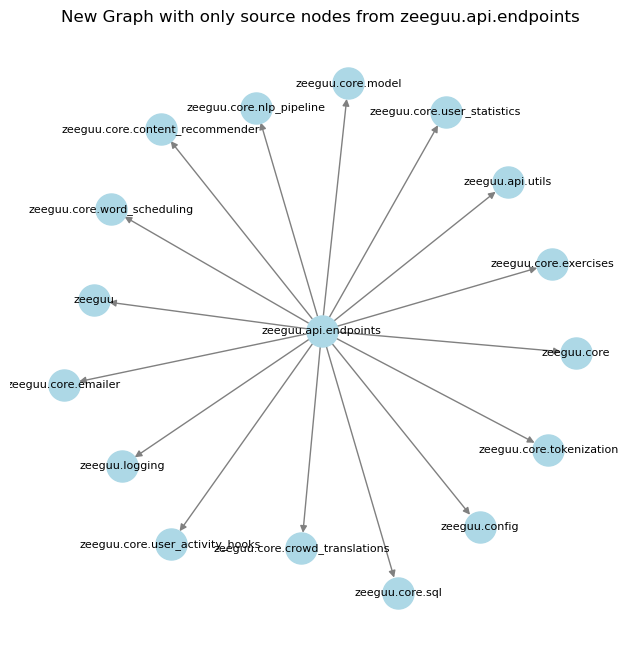

In [ ]:
# I will now make a graph that ONLY has source nodes from the zeeguu.api module and its submodules, and only the first level of dependencies.
# Let's define some relevant modules
def relevant_module2(module_name, isSource):

  if "test" in module_name:
    return False

  if isSource:
    if module_name.startswith("zeeguu\\api\\endpoints") or module_name.startswith("zeeguu.api.endpoints"):
      return True
  else:
    if module_name.startswith("zeeguu"):
      return True

  return False

def dependencies_digraph_source(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module2(source_module, True):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

          if relevant_module2(target_module, False):
            G.add_edge(source_module, target_module)


    return G

DDM = dependencies_digraph_source(CODE_ROOT_FOLDER)
# draw_graph(DDM, (40,40), with_labels=True)
DDM = abstracted_to_top_level(DDM, depth=3)
plt.figure(figsize=(8, 8))
plt.title("New Graph with only source nodes from zeeguu.api.endpoints")
nx.draw(DDM, pos=nx.spring_layout(DDM, k=0.5), with_labels=True, node_size=500, node_color='lightblue', edge_color='gray', font_size=8)
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\graph_endpoints.png", dpi=300, bbox_inches='tight')
plt.show()

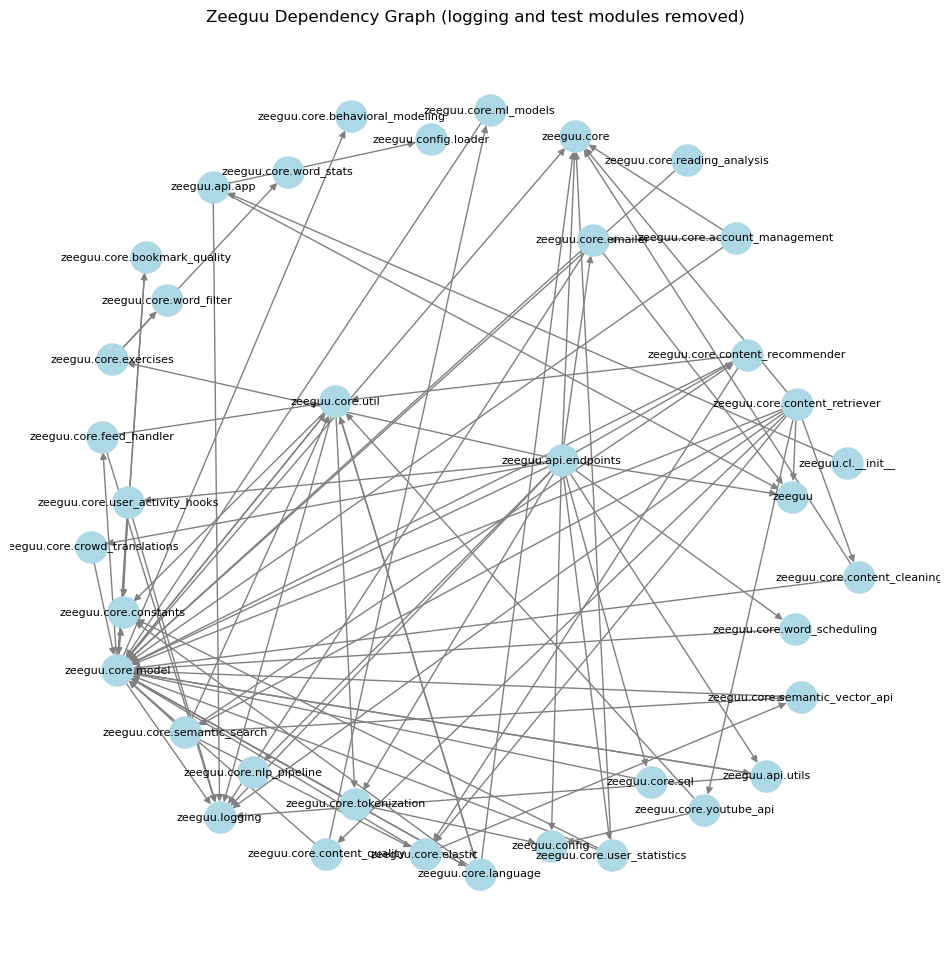

In [ ]:
# Clean the 3-depth diagram

def relevant_module_clean(module_name):

    if "test" in module_name or module_name.startswith("zeeguu\\logging"):
        return False

    if module_name.startswith("zeeguu"):
        return True

    return False

def dependencies_digraph_source(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module_clean(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

          if relevant_module_clean(target_module):
            G.add_edge(source_module, target_module)


    return G

G = dependencies_digraph_source(CODE_ROOT_FOLDER)
# draw_graph(DDM, (40,40), with_labels=True)
G = abstracted_to_top_level(G, depth=3)
plt.figure(figsize=(12, 12))
plt.title("Zeeguu Dependency Graph (logging and test modules removed)")
nx.draw(G, pos=nx.spring_layout(G, k=2.4), with_labels=True, node_size=500, node_color='lightblue', edge_color='gray', font_size=8)
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\dependency_graph_remove_logging.png", dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# I will now make a graph that I will use to make a package diagram, so I will group files by their packages
# and show the dependencies between packages, not files.

def module_name_from_file_path_new(full_path):
    # e.g. ../core/model/user.py -> zeeguu.core.model.user

    file_name = full_path[len(CODE_ROOT_FOLDER):]
    file_name = file_name.replace("/__init__.py","")
    file_name = file_name.replace("/",".")
    # file_name = file_name.replace(".py","")
    return file_name

def dependencies_digraph_only_packages(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path_new(file_path)
        if not relevant_module(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

            if relevant_module(target_module):
              G.add_edge(source_module, target_module)


    return G

def group_files_by_package(module_name, depth=10):
    module_name = module_name.replace("/", ".").replace("\\", ".")
    components = module_name.split(".")
    return ".".join(components[:depth])

def abstracted_to_packages(G, depth=10):
    aG = nx.DiGraph()
    for each in G.edges():
        src = group_files_by_package(each[0], depth)
        dst = group_files_by_package(each[1], depth)

        if src != dst:
          aG.add_edge(src, dst)

    return aG

PackageDiGraph = abstracted_to_packages(DG, 2)  

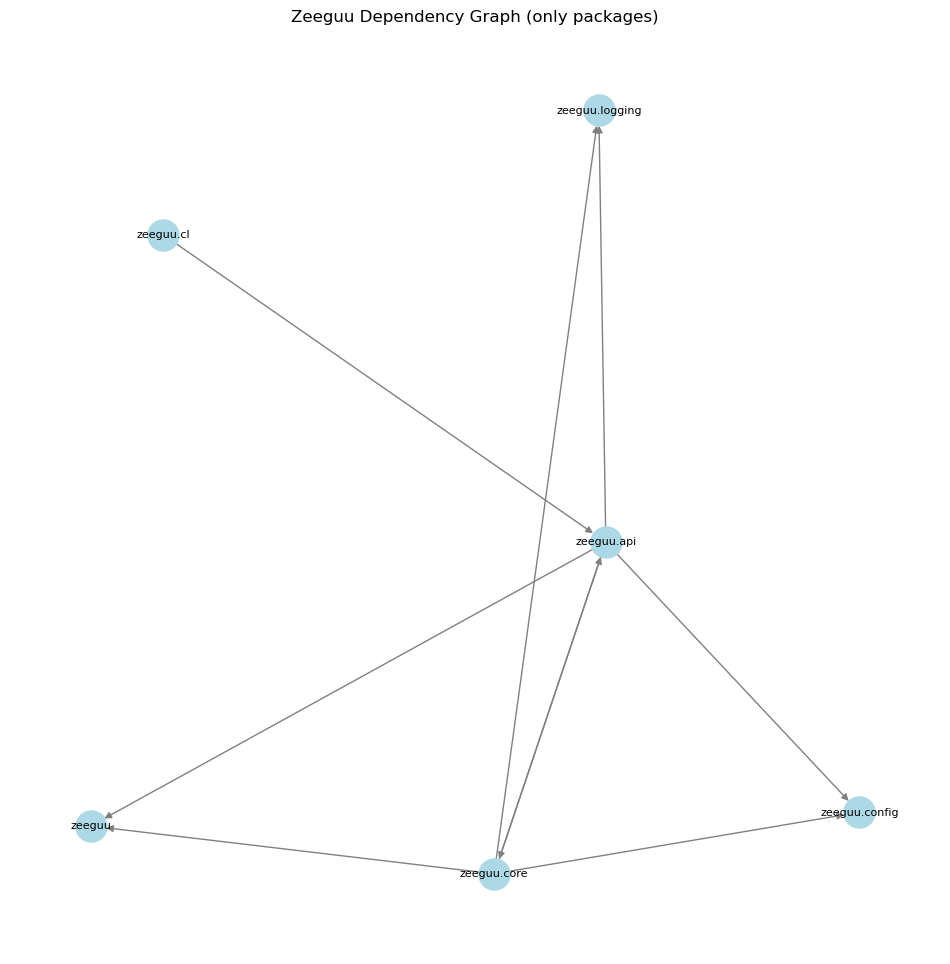

In [ ]:
plt.figure(figsize=(12, 12))
plt.title("Zeeguu Dependency Graph (only packages)")
nx.draw(PackageDiGraph, pos=nx.spring_layout(PackageDiGraph, k=2.3), with_labels=True, node_size=500, node_color='lightblue', edge_color='gray', font_size=8)
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\dependency_graph_only_packages.png", dpi=300, bbox_inches='tight')
plt.show()

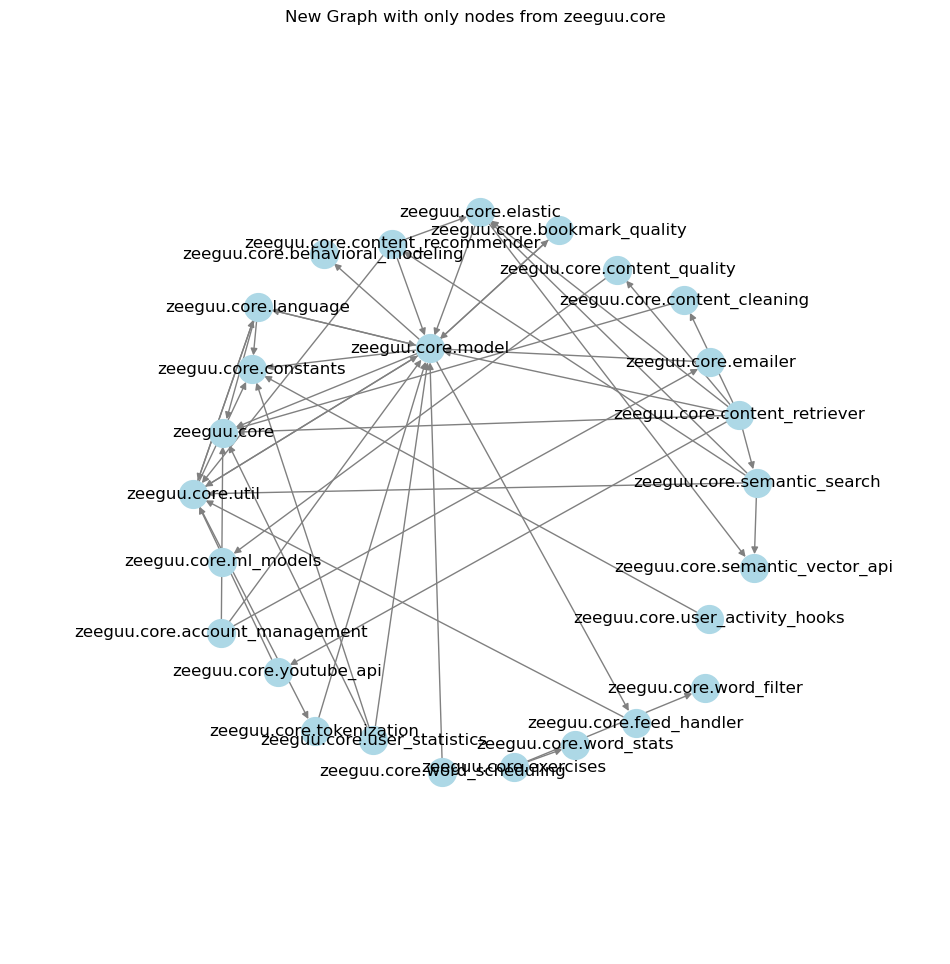

In [ ]:
# I will now make a graph that ONLY has source nodes from the zeeguu.core module and its submodules
# And target is also only zeeguu.core module and its submodules.

def relevant_module3(module_name):

  if "test" in module_name or "__init__" in module_name or module_name.endswith("zeeguu.core.model") or module_name.endswith("zeeguu\\core\\model"):
    return False

  if module_name.startswith("zeeguu\\core") or module_name.startswith("zeeguu.core"):
    return True

  return False

def dependencies_digraph_source_core(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module3(source_module):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

          if relevant_module3(target_module):
            G.add_edge(source_module, target_module)


    return G

core = dependencies_digraph_source_core(CODE_ROOT_FOLDER)
core = abstracted_to_top_level(core, depth=3)
plt.figure(figsize=(12, 12))
plt.title("New Graph with only nodes from zeeguu.core")
plt.margins(0.25)
nx.draw(core, pos=nx.spring_layout(core, k=3, seed=7245555), with_labels=True, node_size=400, node_color='lightblue', edge_color='gray', font_size=12)
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\graph_core.png", dpi=300, bbox_inches='tight')
plt.show()

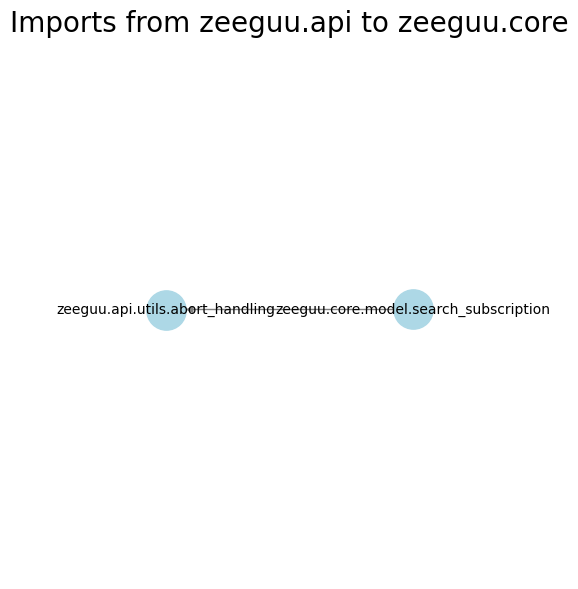

In [ ]:
def relevant_module4(module_name, isSource):

  if "test" in module_name:
    return False

  if isSource:
    if module_name.startswith("zeeguu\\core") or module_name.startswith("zeeguu.core"):
      return True
  else:
    if module_name.startswith("zeeguu\\api") or module_name.startswith("zeeguu.api"):
      return True

  return False

def dependencies_digraph_source(code_root_folder):
    files = Path(code_root_folder).rglob("*.py")

    G = nx.DiGraph()

    for file in files:
        file_path = str(file)

        source_module = module_name_from_file_path(file_path)
        if not relevant_module4(source_module, True):
          continue

        if source_module not in G.nodes:
            G.add_node(source_module)

        for target_module in imports_from_file(file_path):

          if relevant_module4(target_module, False):
            G.add_edge(source_module, target_module)


    return G

DDM = dependencies_digraph_source(CODE_ROOT_FOLDER)
# draw_graph(DDM, (40,40), with_labels=True)
DDM = abstracted_to_top_level(DDM, depth=5)
plt.figure(figsize=(7, 7))
plt.title("Imports from zeeguu.api to zeeguu.core", fontsize=20)
plt.margins(0.5)
nx.draw(DDM, pos=nx.circular_layout(DDM), with_labels=True, node_size=800, node_color='lightblue', edge_color='gray', font_size=10)
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\from_core_to_api.png", dpi=300, bbox_inches='tight')
plt.show()

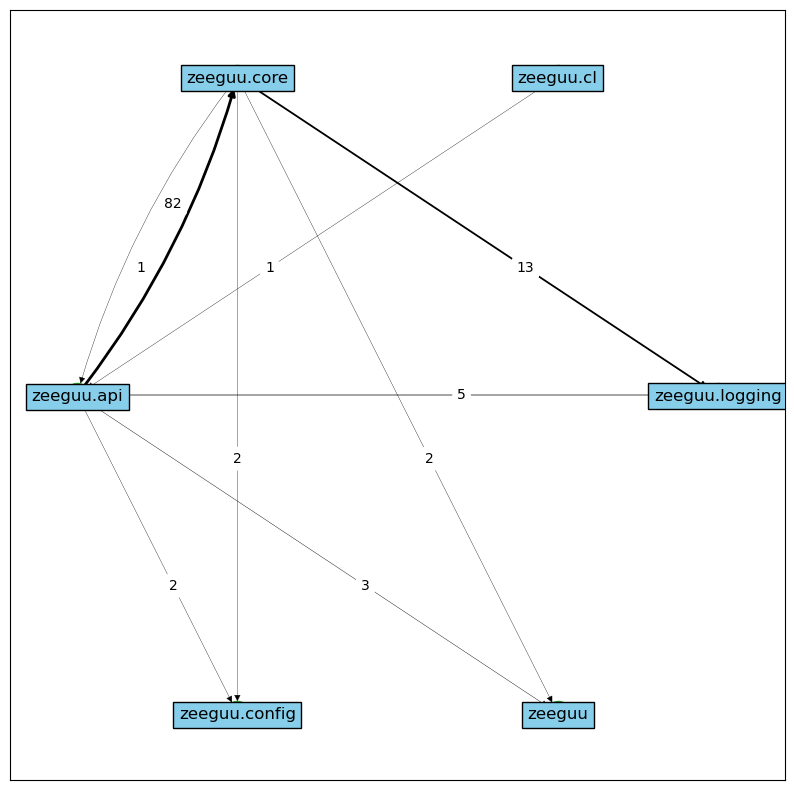

In [ ]:
### I document here the help I got from from David (daso) after I gave up on drawing the edges the way I wanted ###

def verbose_abstracted_to_top_level(G : nx.DiGraph, depth=1):
    aG = nx.DiGraph()
    for each in G.edges():
        src = group_files_by_package(each[0], depth)
        dst = group_files_by_package(each[1], depth)

        if src != dst:
          if (src, dst) in aG.edges():
            w = aG[src][dst]['weight'] # Credit to Claude.AI
            aG.add_edge(src, dst, weight=w+1)
          else:
             aG.add_edge(src, dst, weight=1)

    return aG

PackageDiGraph = verbose_abstracted_to_top_level(DG, 2) 

### PREPARE ###
pos = nx.shell_layout(PackageDiGraph)
fig = plt.figure(figsize=(10,10))

# Edges
curved_edges = [edge for edge in PackageDiGraph.edges() if reversed(edge) in PackageDiGraph.edges()]
straight_edges = list(set(PackageDiGraph.edges()) - set(curved_edges))
arc_rad = 0.1

# Edge weights
edge_weights = nx.get_edge_attributes(PackageDiGraph, 'weight')


straight_edge_widths = [max(0.25, min(2, edge_weights[edge]/10)) for edge in straight_edges]
curved_edge_widths = [max(0.25, min(2, edge_weights[edge]/10)) for edge in curved_edges]

curved_edge_labels = {edge: edge_weights[edge] for edge in curved_edges}
straight_edge_labels = {edge: edge_weights[edge] for edge in straight_edges}

### DRAW ###
# Nodes
nx.draw_networkx_nodes(PackageDiGraph, pos, node_color="tab:green")
nx.draw_networkx_labels(PackageDiGraph, pos, 
                        bbox = dict(facecolor = "skyblue"),
                        verticalalignment='center_baseline', horizontalalignment='center', 
                        alpha=1
                        )

# Edges
nx.draw_networkx_edges(PackageDiGraph, pos, edgelist=straight_edges, width=straight_edge_widths)
nx.draw_networkx_edges(PackageDiGraph, pos, edgelist=curved_edges, connectionstyle=f'arc3, rad = {arc_rad}', width=curved_edge_widths)

# Edge labels
nx.draw_networkx_edge_labels(PackageDiGraph, pos, edge_labels=curved_edge_labels, 
                             rotate=False,# connectionstyle=f'arc3, rad = {arc_rad}',
                             label_pos=0.4)
nx.draw_networkx_edge_labels(PackageDiGraph, pos, edge_labels=straight_edge_labels,
                             rotate=False, label_pos=0.4)

# Draw
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\digraph_with_weights.png", dpi=300, bbox_inches='tight', pad_inches=0)

{'LICENSE': 2, 'README.md': 52, 'setup.py': 46, 'zeeguu_api.wsgi': 24, '.gitignore': 22, 'cleanup.sh': 1, 'run_tests.sh': 13, 'default_api.cfg': 22, 'env_var_defs_default.py': 6, '.githooks\\pre-commit': 5, '.githooks\\rules\\routes_should_not_end_in_slash': 4, '.github\\workflows\\test.yml': 25, 'tools\\__init__.py': 1, 'tools\\article_crawler.py': 10, 'tools\\feed_info.py': 6, 'tools\\sh\\create_test_db.sh': 1, 'tools\\sh\\live-log.sh': 1, 'tools\\sh\\run_tests.sh': 1, 'tools\\sh\\update_dock.sh': 1, 'tools\\_playground.py': 16, 'tools\\sh\\live_show_exercise_outcomes.sh': 2, 'tools\\sql\\exercise_corectness.sql': 2, 'tools\\sql\\most_recent_active_teachers.sql': 3, 'tools\\sql\\popular_exercise_outcomes.sql': 3, 'tools\\sql\\recent_exercise_outcomes.sql': 3, 'tools\\sql\\user_exercise_history.sql': 5, 'zeeguu\\__init__.py': 2, 'zeeguu\\api\\__init__.py': 2, 'zeeguu\\api\\app.py': 81, 'zeeguu\\api\\cross_domain_app.py': 3, 'zeeguu\\api\\custom_fmd_graphs.py': 3, 'zeeguu\\api\\machine

<Figure size 1000x1000 with 0 Axes>

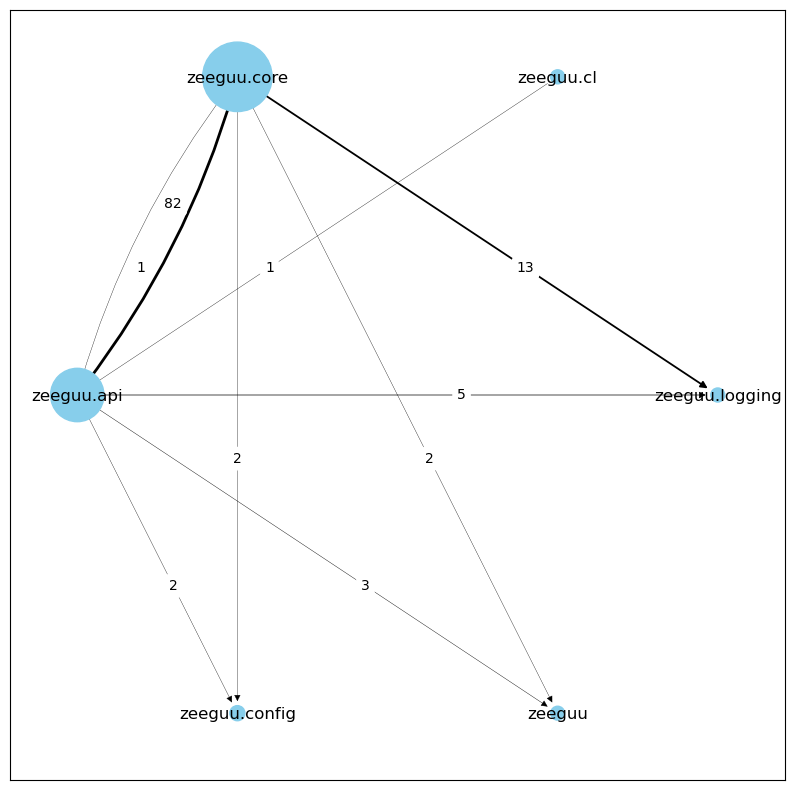

In [ ]:
### MODIFY NODE SIZES BASED ON COMMIT ACTIVITY ###

print(commit_counts)

def group_commit_counts_by_package(commit_counts, depth=2):
    package_activity = defaultdict(int)

    for path, count in commit_counts.items():
        if ".py" in str(path):
            l2_module = top_level_package(module_name_from_rel_path(path), depth)
            package_activity[l2_module] += count

    return package_activity

commit_counts_grouped = group_commit_counts_by_package(commit_counts, 2)
print(commit_counts_grouped)

# i use a log scale for the node sizes so they are between 100 and 2500
sizes = []
for n in PackageDiGraph.nodes():
  try:
    sizes.append(100 + 2400 * (commit_counts_grouped[n] / max(commit_counts_grouped.values())))
  except:
    sizes.append(100)

edge_weights = nx.get_edge_attributes(PackageDiGraph, 'weight')

plt.figure(figsize=(10,10))
pos = nx.shell_layout(PackageDiGraph)
fig = plt.figure(figsize=(10,10))

# Edges
curved_edges = [edge for edge in PackageDiGraph.edges() if reversed(edge) in PackageDiGraph.edges()]
straight_edges = list(set(PackageDiGraph.edges()) - set(curved_edges))
arc_rad = 0.1

# Edge weights
edge_weights = nx.get_edge_attributes(PackageDiGraph, 'weight')
straight_edge_widths = [max(0.25, min(2, edge_weights[edge]/10)) for edge in straight_edges]
curved_edge_widths = [max(0.25, min(2, edge_weights[edge]/10)) for edge in curved_edges]
curved_edge_labels = {edge: edge_weights[edge] for edge in curved_edges}
straight_edge_labels = {edge: edge_weights[edge] for edge in straight_edges}

### DRAW ###
# Nodes
nx.draw_networkx_nodes(PackageDiGraph, pos, node_color="skyblue", node_size=sizes), 
nx.draw_networkx_labels(PackageDiGraph, pos,
                        # bbox = dict(facecolor = "skyblue"),
                        verticalalignment='center_baseline', horizontalalignment='center', 
                        alpha=1
                        )

# Edges
nx.draw_networkx_edges(PackageDiGraph, pos, edgelist=straight_edges, width=straight_edge_widths)
nx.draw_networkx_edges(PackageDiGraph, pos, edgelist=curved_edges, connectionstyle=f'arc3, rad = {arc_rad}', width=curved_edge_widths)

# Edge labels
nx.draw_networkx_edge_labels(PackageDiGraph, pos, edge_labels=curved_edge_labels, 
                             rotate=False,# connectionstyle=f'arc3, rad = {arc_rad}',
                             label_pos=0.4)
nx.draw_networkx_edge_labels(PackageDiGraph, pos, edge_labels=straight_edge_labels,
                             rotate=False, label_pos=0.4)

# Draw
plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\digraph_weights_and_churn.png", dpi=300, bbox_inches='tight', pad_inches=0)

[('zeeguu.core.model.search_subscription', 'zeeguu.api.utils.abort_handling')]
['zeeguu.core.model.search_subscription', 'zeeguu.api.utils.abort_handling']


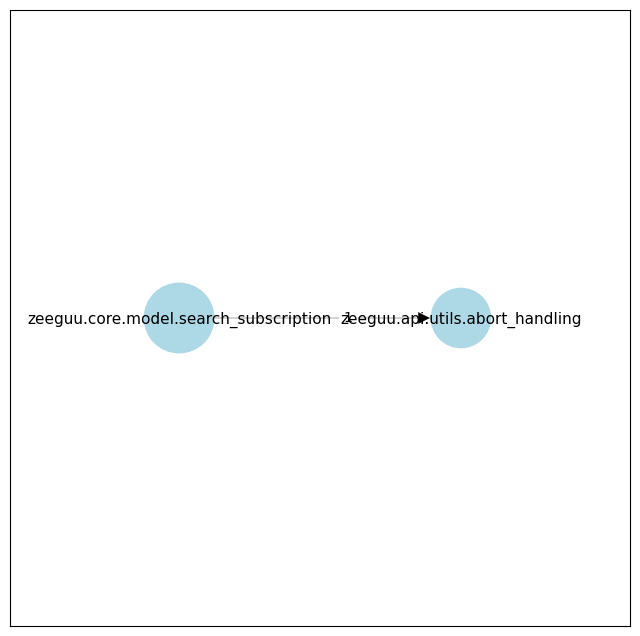

In [ ]:
DDM2 = dependencies_digraph_source(CODE_ROOT_FOLDER)
DDM2 = abstracted_to_top_level(DDM2, depth=5)
DDM2 = verbose_abstracted_to_top_level(DDM2, 5) 

commit_counts_grouped = group_commit_counts_by_package(commit_counts, 5)

### NORMALIZE NODE SIZES ###
for key in list(commit_counts_grouped.keys()):
  if key not in DDM2.nodes():
    commit_counts_grouped.pop(key)

sizes = []
for n in DDM2.nodes():
  try:
    sizes.append(100 + 2400 * (commit_counts_grouped[n] / max(commit_counts_grouped.values())))
  except:
    sizes.append(100)

print(DDM2.edges())
print(DDM2.nodes())

## SETUP ##
pos = nx.shell_layout(DDM2)
fig = plt.figure(figsize=(8,8))

# Edges
curved_edges = [edge for edge in DDM2.edges() if reversed(edge) in DDM2.edges()]
straight_edges = list(set(DDM2.edges()) - set(curved_edges))
arc_rad = 0.1

# Edge weights
edge_weights = nx.get_edge_attributes(DDM2, 'weight')
straight_edge_widths = [max(0.25, min(2, edge_weights.get(edge, 0)/10)) for edge in straight_edges]
curved_edge_widths = [max(0.25, min(2, edge_weights.get(edge, 0)/10)) for edge in curved_edges]
curved_edge_labels = {edge: edge_weights.get(edge, 0) for edge in curved_edges}
straight_edge_labels = {edge: edge_weights.get(edge, 0) for edge in straight_edges}

### DRAW ###
# Nodes
nx.draw_networkx_nodes(DDM2, pos, node_color="lightblue", node_size=sizes), 
nx.draw_networkx_labels(DDM2, pos,
                        # bbox = dict(facecolor = "skyblue"),
                        verticalalignment='center_baseline', horizontalalignment='center', 
                        alpha=1,
                        font_size=11
                        )

# Edges
nx.draw_networkx_edges(DDM2, pos, edgelist=straight_edges, width=straight_edge_widths, node_size=2000, arrowsize=20)
nx.draw_networkx_edges(DDM2, pos, edgelist=curved_edges, connectionstyle=f'arc3, rad = {arc_rad}', width=curved_edge_widths, node_size=2000, arrowsize=20)

# Edge labels
nx.draw_networkx_edge_labels(DDM2, pos, edge_labels=curved_edge_labels, 
                             rotate=False,# connectionstyle=f'arc3, rad = {arc_rad}',
                             label_pos=0.4)
nx.draw_networkx_edge_labels(DDM2, pos, edge_labels=straight_edge_labels,
                             rotate=False, label_pos=0.4)
plt.margins(0.5)




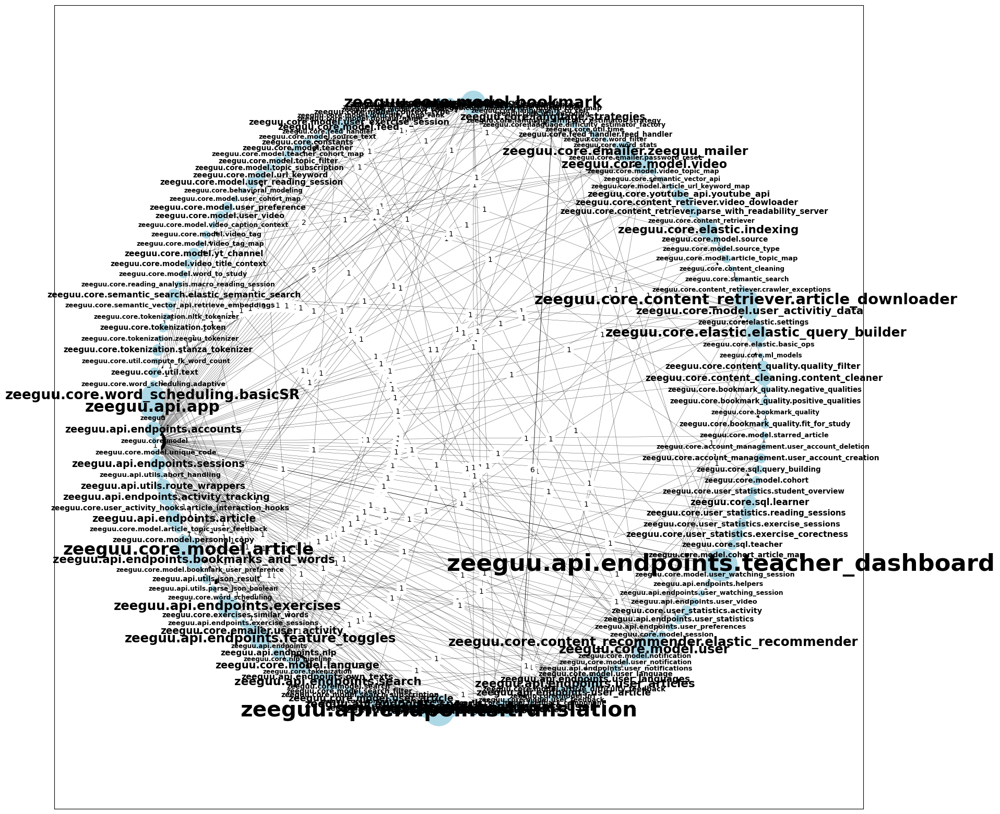

In [ ]:
def relevant_module(module_name):

  if "test" in module_name or "__init__" in module_name or "logging" in module_name or module_name.endswith("util") or "config" in module_name or module_name.endswith("utils"):
    return False

  if module_name.startswith("zeeguu"):
    return True

  return False

chaos_graph = dependencies_digraph(CODE_ROOT_FOLDER)
chaos_graph = verbose_abstracted_to_top_level(chaos_graph, 4) 

commit_counts_grouped = group_commit_counts_by_package(commit_counts, 4)

### NORMALIZE NODE SIZES ###
for key in list(commit_counts_grouped.keys()):
  if key not in chaos_graph.nodes():
    commit_counts_grouped.pop(key)

sizes = []
for n in chaos_graph.nodes():
  try:
    sizes.append(50 + 1950 * (commit_counts_grouped[n] / max(commit_counts_grouped.values())))
  except:
    sizes.append(50)

## SETUP ##
pos = nx.shell_layout(chaos_graph)
fig = plt.figure(figsize=(20,20))

# Edges
curved_edges = [edge for edge in chaos_graph.edges() if reversed(edge) in chaos_graph.edges()]
straight_edges = list(set(chaos_graph.edges()) - set(curved_edges))
arc_rad = 0.1

# Edge weights
edge_weights = nx.get_edge_attributes(chaos_graph, 'weight')
straight_edge_widths = [max(0.25, min(2, edge_weights.get(edge, 0)/10)) for edge in straight_edges]
curved_edge_widths = [max(0.25, min(2, edge_weights.get(edge, 0)/10)) for edge in curved_edges]
curved_edge_labels = {edge: edge_weights.get(edge, 0) for edge in curved_edges}
straight_edge_labels = {edge: edge_weights.get(edge, 0) for edge in straight_edges}

### DRAW ###
# Nodes
nx.draw_networkx_nodes(chaos_graph, pos, node_color="lightblue", node_size=sizes), 

# nx.draw_networkx_labels(chaos_graph, pos,
#                         # bbox = dict(facecolor = "skyblue"),
#                         verticalalignment='center_baseline', horizontalalignment='center', 
#                         alpha=1,
#                         font_size=9
#                         )

# replacing above logic with something like 
# for node, (x, y) in pos.items():
#     text(x, y, node, fontsize=d[node]*5, ha='center', va='center')

counter = 0
for node, (x, y) in pos.items():
    plt.text(x, y, node, fontsize=sizes[counter]/82+8, ha='center', va='center', color='black', fontweight='bold')
    counter += 1


# Edges
nx.draw_networkx_edges(chaos_graph, pos, edgelist=straight_edges, width=straight_edge_widths, node_size=500, arrowsize=10)
nx.draw_networkx_edges(chaos_graph, pos, edgelist=curved_edges, connectionstyle=f'arc3, rad = {arc_rad}', width=curved_edge_widths, node_size=500, arrowsize=10)

# Edge labels
nx.draw_networkx_edge_labels(chaos_graph, pos, edge_labels=curved_edge_labels, 
                             rotate=False,# connectionstyle=f'arc3, rad = {arc_rad}',
                             label_pos=0.4)
nx.draw_networkx_edge_labels(chaos_graph, pos, edge_labels=straight_edge_labels,
                             rotate=False, label_pos=0.4)
plt.margins(0.1)




[('api.app', 'zeeguu'), ('api.endpoints.accounts', 'core.model'), ('api.endpoints.accounts', 'core'), ('api.endpoints.accounts', 'api.endpoints.sessions'), ('core', 'core.model'), ('core', 'core.bookmark_quality'), ('core', 'core.ml_models'), ('core', 'elasticsearch'), ('core', 'core.semantic_search'), ('core', 'core.content_cleaning'), ('core', 'core.content_retriever'), ('core', 'zeeguu'), ('core', 'core.word_stats'), ('core', 'core.word_filter'), ('core', 'core.feed_handler'), ('core', 'core.behavioral_modeling'), ('core', 'core.semantic_vector_api'), ('api.endpoints.sessions', 'core.model'), ('api.endpoints.activity_tracking', 'core'), ('api.endpoints.activity_tracking', 'core.model'), ('api.endpoints.article', 'core.model'), ('api.endpoints.article', 'core'), ('api.endpoints.bookmarks_and_words', 'core.model'), ('api.endpoints.bookmarks_and_words', 'core'), ('api.endpoints.bookmarks_and_words', 'core.word_scheduling'), ('api.endpoints.exercises', 'core'), ('api.endpoints.exercises

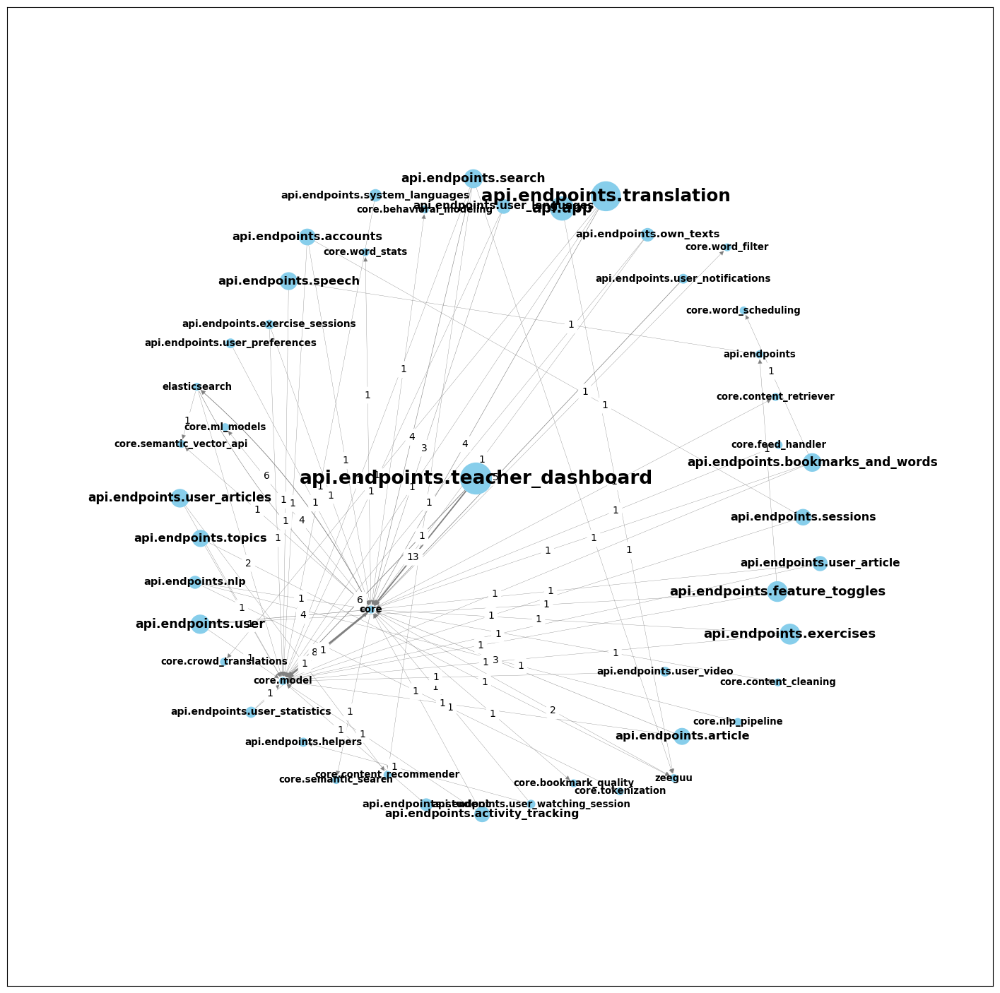

In [131]:
import re

def group_files_by_package(module_name, depth=3):
    module_name = module_name.replace("/", ".").replace("\\", ".")
    components = module_name.split(".")
    if ".elastic." in module_name or "/elastic/" in module_name:
      return "elasticsearch"
    if module_name.startswith("zeeguu.core") or module_name.startswith("zeeguu/core"):
      if len(components) > 3:
        return ".".join(components[:(min(2, depth))])
    return ".".join(components[:depth])

def relevant_module(module_name):

  excluding = ["test", "__init__", "logging", "util", "config", "utils", "constants", "tools"]

  for str in excluding:
    if str in module_name:
      return False
  
  if module_name.startswith("zeeguu"):
    return True

  return False

chaos_graph = dependencies_digraph(CODE_ROOT_FOLDER)
chaos_graph = verbose_abstracted_to_top_level(chaos_graph, 4) 

commit_counts_grouped = group_commit_counts_by_package(commit_counts, 4)

### NORMALIZE NODE SIZES ###
for key in list(commit_counts_grouped.keys()):
  if key not in chaos_graph.nodes():
    commit_counts_grouped.pop(key)

sizes = []
for n in chaos_graph.nodes():
  try:
    sizes.append(50 + 950 * (commit_counts_grouped[n] / max(commit_counts_grouped.values())))
  except:
    sizes.append(50)

#loop thourhg nodes and edges and remove first part of the name
for node in list(chaos_graph.nodes()):
  if node.startswith("zeeguu"):
    new_node = node.replace("zeeguu.", "")
    chaos_graph = nx.relabel_nodes(chaos_graph, {node: new_node})

for edge in list(chaos_graph.edges()):
  if edge[0].startswith("zeeguu") and edge[1].startswith("zeeguu"):
    new_edge = (edge[0].replace("zeeguu.", ""), edge[1].replace("zeeguu.", ""))
    chaos_graph = nx.relabel_nodes(chaos_graph, {edge: new_edge})

## SETUP ##
pos = nx.spring_layout(chaos_graph, seed=14, k=3)
fig = plt.figure(figsize=(18,18))

# # Edge weights
# edge_weights = nx.get_edge_attributes(chaos_graph, 'weight')
# edge_widths = [max(0.15, min(5, edge_weights[edge]/10)) for edge in chaos_graph.edges()]

# Edges
curved_edges = [edge for edge in chaos_graph.edges() if reversed(edge) in chaos_graph.edges()]
straight_edges = list(set(chaos_graph.edges()) - set(curved_edges))
arc_rad = 0.1

# Edge weights
edge_weights = nx.get_edge_attributes(chaos_graph, 'weight')
straight_edge_widths = [max(0.25, min(2, edge_weights.get(edge, 0)/10)) for edge in straight_edges]
curved_edge_widths = [max(0.25, min(2, edge_weights.get(edge, 0)/10)) for edge in curved_edges]
curved_edge_labels = {edge: edge_weights.get(edge, 0) for edge in curved_edges}
straight_edge_labels = {edge: edge_weights.get(edge, 0) for edge in straight_edges}


print(chaos_graph.edges())

### DRAW ###
# Nodes
nx.draw_networkx_nodes(chaos_graph, pos, node_color="skyblue", node_size=sizes), 

counter = 0
for node, (x, y) in pos.items():
    # intensity = max(sizes[counter] / max(sizes), 0.6)  # Normalize intensity between 0 and 1
    # color = (1 -(intensity/2), 1-intensity, 0, intensity)  # RGBA color with intensity as alpha
    color = "black"  
    plt.text(x, y, node, fontsize=sizes[counter]/100+9, ha='center', va='center', color=color, fontweight='bold')
    counter += 1

# Edges
# nx.draw_networkx_edges(chaos_graph, pos, chaos_graph.edges(), width=edge_widths, node_size=100, arrowsize=8)
# Edges
nx.draw_networkx_edges(chaos_graph, pos, edgelist=straight_edges, width=straight_edge_widths, node_size=100, arrowsize=10, edge_color='gray')
nx.draw_networkx_edges(chaos_graph, pos, edgelist=curved_edges, connectionstyle=f'arc3, rad = {arc_rad}', width=curved_edge_widths, node_size=100, arrowsize=10, edge_color='gray')

# Edge labels
nx.draw_networkx_edge_labels(chaos_graph, pos, edge_labels=curved_edge_labels, 
                             rotate=False,# connectionstyle=f'arc3, rad = {arc_rad}',
                             label_pos=0.4)
nx.draw_networkx_edge_labels(chaos_graph, pos, edge_labels=straight_edge_labels,
                             rotate=False, label_pos=0.4)


plt.margins(0.2)

plt.savefig("C:\\Users\\nikol\\Documents\\uni\\CS2\\Software Architecture\\Individual project\\chaos_graph_11-05.png", dpi=300, bbox_inches='tight', pad_inches=0)
